- Null-text Inversion implementation (official): [https://github.com/google/prompt-to-prompt/blob/main/null_text_w_ptp.ipynb](https://github.com/google/prompt-to-prompt/blob/main/null_text_w_ptp.ipynb)
- Imagic implementation (unofficial): [https://github.com/justinpinkney/stable-diffusion/blob/main/notebooks/imagic.ipynb](https://github.com/justinpinkney/stable-diffusion/blob/main/notebooks/imagic.ipynb)
- Diffusers Community Pipeline, Imagic: [https://github.com/MarkRich/diffusers/blob/8d1d60c4c2554c355f856ef330fb7b7f00f329b9/examples/community/imagic_stable_diffusion.py](https://github.com/MarkRich/diffusers/blob/8d1d60c4c2554c355f856ef330fb7b7f00f329b9/examples/community/imagic_stable_diffusion.py) 
[https://github.com/huggingface/diffusers/issues/895](https://github.com/huggingface/diffusers/issues/895)

 # Requirements, imports and loads

In [ ]:
!pip install xformers

In [ ]:
!pip install diffusers==0.8.1

In [ ]:
!pip install transformers

In [ ]:
!pip install accelerate

In [ ]:
!wget https://raw.githubusercontent.com/google/prompt-to-prompt/main/seq_aligner.py -O seq_aligner.py
!wget https://raw.githubusercontent.com/google/prompt-to-prompt/main/ptp_utils.py -O ptp_utils.py

In [ ]:
!gdown --fuzzy "https://drive.google.com/file/d/1r-eToqw2g9kRI7Ohj25DgHuPwXGL20CZ/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1Uu1RkeyJfBnnyi9DNLxzCPFNOqfD-7VO/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1jGtvZn7hKgU7VmcEzkh5JfLqukup5hSH/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1LLNJ4hC4z3BPR0NV5qM28tiHAyRNPZk1/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1nWhF-KQYNfxnNx7zPC7PJmZSHatMA0aX/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1S2067l5_sgNqY5r7GGWtUt4PRGmo1TSn/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/11QOUgiSXAzsOKgrGQqTrYrYTq4a-7p_6/view?usp=share_link"
!gdown --fuzzy "https://drive.google.com/file/d/1IieqtKKazHWeRgXKLw8U0-8PPeaT8xMX/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/14YyAwDyJshY4VT1fa8nUVRmDvQ26sZ8V/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1Gu76sgVh_v_-C3165ZM333-QIgg1J_oE/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1FPhPtUReFpcAfatA-2avd6vGt0_lSKrM/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1E3Zc74AyKiIEZkzR_U6TGraB2YwaQMh0/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1A4w9Dw-dRO8t198d0bGg5lkkt9WDt8m7/view?usp=sharing"

In [ ]:
from typing import Optional, Union, Tuple, List, Callable, Dict
from tqdm.notebook import tqdm
import torch
from diffusers import StableDiffusionPipeline, DDIMScheduler
import torch.nn.functional as nnf
import numpy as np
import abc
import ptp_utils
import seq_aligner
import shutil
from torch.optim.adam import Adam
from PIL import Image

# Null-text Inversion with Learned Embedding & Regularization

In [ ]:
scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False, set_alpha_to_one=False)
LOW_RESOURCE = False 
NUM_DDIM_STEPS = 50
GUIDANCE_SCALE = 7.5
MAX_NUM_WORDS = 77
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
ldm_stable = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", scheduler=scheduler).to(device)
try:
    ldm_stable.disable_xformers_memory_efficient_attention()
except AttributeError:
    print("Attribute disable_xformers_memory_efficient_attention() is missing")
tokenizer = ldm_stable.tokenizer

## Null Text Inversion code

In [ ]:
from copy import copy

def load_512(image_path, left=0, right=0, top=0, bottom=0):
    if type(image_path) is str:
        image = np.array(Image.open(image_path))[:, :, :3]
    else:
        image = image_path
    h, w, c = image.shape
    left = min(left, w-1)
    right = min(right, w - left - 1)
    top = min(top, h - left - 1)
    bottom = min(bottom, h - top - 1)
    image = image[top:h-bottom, left:w-right]
    h, w, c = image.shape
    if h < w:
        offset = (w - h) // 2
        image = image[:, offset:offset + h]
    elif w < h:
        offset = (h - w) // 2
        image = image[offset:offset + w]
    image = np.array(Image.fromarray(image).resize((512, 512)))
    return image


class NullInversion:
    
    def prev_step(self, model_output: Union[torch.FloatTensor, np.ndarray], timestep: int, sample: Union[torch.FloatTensor, np.ndarray]):
        prev_timestep = timestep - self.scheduler.config.num_train_timesteps // self.scheduler.num_inference_steps
        alpha_prod_t = self.scheduler.alphas_cumprod[timestep]
        alpha_prod_t_prev = self.scheduler.alphas_cumprod[prev_timestep] if prev_timestep >= 0 else self.scheduler.final_alpha_cumprod
        beta_prod_t = 1 - alpha_prod_t
        pred_original_sample = (sample - beta_prod_t ** 0.5 * model_output) / alpha_prod_t ** 0.5
        pred_sample_direction = (1 - alpha_prod_t_prev) ** 0.5 * model_output
        prev_sample = alpha_prod_t_prev ** 0.5 * pred_original_sample + pred_sample_direction
        return prev_sample
    
    def next_step(self, model_output: Union[torch.FloatTensor, np.ndarray], timestep: int, sample: Union[torch.FloatTensor, np.ndarray]):
        timestep, next_timestep = min(timestep - self.scheduler.config.num_train_timesteps // self.scheduler.num_inference_steps, 999), timestep
        alpha_prod_t = self.scheduler.alphas_cumprod[timestep] if timestep >= 0 else self.scheduler.final_alpha_cumprod
        alpha_prod_t_next = self.scheduler.alphas_cumprod[next_timestep]
        beta_prod_t = 1 - alpha_prod_t
        next_original_sample = (sample - beta_prod_t ** 0.5 * model_output) / alpha_prod_t ** 0.5
        next_sample_direction = (1 - alpha_prod_t_next) ** 0.5 * model_output
        next_sample = alpha_prod_t_next ** 0.5 * next_original_sample + next_sample_direction
        return next_sample
    
    def get_noise_pred_single(self, latents, t, context):
        noise_pred = self.model.unet(latents, t, encoder_hidden_states=context)["sample"]
        return noise_pred

    def get_noise_pred(self, latents, t, is_forward=True, context=None):
        latents_input = torch.cat([latents] * 2)
        if context is None:
            context = self.context
        guidance_scale = 1 if is_forward else GUIDANCE_SCALE
        noise_pred = self.model.unet(latents_input, t, encoder_hidden_states=context)["sample"]
        noise_pred_uncond, noise_prediction_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_prediction_text - noise_pred_uncond)
        if is_forward:
            latents = self.next_step(noise_pred, t, latents)
        else:
            latents = self.prev_step(noise_pred, t, latents)
        return latents

    @torch.no_grad()
    def latent2image(self, latents, return_type='np'):
        latents = 1 / 0.18215 * latents.detach()
        image = self.model.vae.decode(latents)['sample']
        if return_type == 'np':
            image = (image / 2 + 0.5).clamp(0, 1)
            image = image.cpu().permute(0, 2, 3, 1).numpy()[0]
            image = (image * 255).astype(np.uint8)
        return image

    @torch.no_grad()
    def image2latent(self, image):
        with torch.no_grad():
            if type(image) is Image:
                image = np.array(image)
            if type(image) is torch.Tensor and image.dim() == 4:
                latents = image
            else:
                image = torch.from_numpy(image).float() / 127.5 - 1
                image = image.permute(2, 0, 1).unsqueeze(0).to(device)
                latents = self.model.vae.encode(image)['latent_dist'].mean
                latents = latents * 0.18215
        return latents

    @torch.no_grad()
    def init_prompt(self, prompt, max_length=None):
        uncond_input = self.model.tokenizer(
            [""], padding="max_length", max_length=max_length,
            return_tensors="pt"
        )
        uncond_embeddings = self.model.text_encoder(uncond_input.input_ids.to(self.model.device))[0]
        if type(prompt) == str:
            text_input = self.model.tokenizer(
                [prompt],
                padding="max_length",
                max_length=self.model.tokenizer.model_max_length,
                truncation=True,
                return_tensors="pt",
            )
            text_embeddings = self.model.text_encoder(text_input.input_ids.to(self.model.device))[0]
        else:
            text_embeddings = prompt
        self.context = torch.cat([uncond_embeddings, text_embeddings])
        #self.prompt = prompt

    @torch.no_grad()
    def ddim_loop(self, latent):
        uncond_embeddings, cond_embeddings = self.context.chunk(2)
        all_latent = [latent]
        latent = latent.clone().detach()
        for i in range(NUM_DDIM_STEPS):
            t = self.model.scheduler.timesteps[len(self.model.scheduler.timesteps) - i - 1]
            noise_pred = self.get_noise_pred_single(latent, t, cond_embeddings)
            latent = self.next_step(noise_pred, t, latent)
            all_latent.append(latent)
        return all_latent

    @property
    def scheduler(self):
        return self.model.scheduler

    @torch.no_grad()
    def ddim_inversion(self, image):
        latent = self.image2latent(image)
        image_rec = self.latent2image(latent)
        ddim_latents = self.ddim_loop(latent)
        return image_rec, ddim_latents

    def null_optimization(self, latents, num_inner_steps, epsilon):
        uncond_embeddings, cond_embeddings = self.context.chunk(2)
        uncond_embeddings_list = []
        latent_cur = latents[-1]
        bar = tqdm(total=num_inner_steps * NUM_DDIM_STEPS)
        for i in range(NUM_DDIM_STEPS):
            uncond_embeddings = uncond_embeddings.clone().detach()
            uncond_embeddings.requires_grad = True
            optimizer = Adam([uncond_embeddings], lr=1e-2 * (1. - i / 100.))
            latent_prev = latents[len(latents) - i - 2]
            t = self.model.scheduler.timesteps[i]
            with torch.no_grad():
                noise_pred_cond = self.get_noise_pred_single(latent_cur, t, cond_embeddings)
            for j in range(num_inner_steps):
                noise_pred_uncond = self.get_noise_pred_single(latent_cur, t, uncond_embeddings)
                noise_pred = noise_pred_uncond + GUIDANCE_SCALE * (noise_pred_cond - noise_pred_uncond)
                latents_prev_rec = self.prev_step(noise_pred, t, latent_cur)
                loss = nnf.mse_loss(latents_prev_rec, latent_prev)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                loss_item = loss.item()
                bar.update()
                if loss_item < epsilon + i * 2e-5:
                    break
            for j in range(j + 1, num_inner_steps):
                bar.update()
            uncond_embeddings_list.append(uncond_embeddings[:1].detach())
            with torch.no_grad():
                context = torch.cat([uncond_embeddings, cond_embeddings])
                latent_cur = self.get_noise_pred(latent_cur, t, False, context)
        bar.close()
        return uncond_embeddings_list
    
    def invert(self, image_path: str, prompt, max_length=None, offsets=(0,0,0,0), num_inner_steps=10, early_stop_epsilon=1e-5, verbose=False):
        self.init_prompt(prompt, max_length)
        ptp_utils.register_attention_control(self.model, None)
        image_gt = load_512(image_path, *offsets)
        if verbose:
            print("DDIM inversion...")
        image_rec, ddim_latents = self.ddim_inversion(image_gt)
        if verbose:
            print("Null-text optimization...")
        uncond_embeddings = self.null_optimization(ddim_latents, num_inner_steps, early_stop_epsilon)
        return (image_gt, image_rec), ddim_latents[-1], uncond_embeddings
        
    
    def __init__(self, model):
        scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False,
                                  set_alpha_to_one=False)
        self.model = model
        self.tokenizer = self.model.tokenizer
        self.model.scheduler.set_timesteps(NUM_DDIM_STEPS)
        self.prompt = None
        self.context = None

null_inversion = NullInversion(copy(ldm_stable))

## Infernce Code

In [ ]:
@torch.no_grad()
def diffusion_step(model, latents, context, t, guidance_scale, low_resource=False):
    if low_resource:
        noise_pred_uncond = model.unet(latents, t, encoder_hidden_states=context[0])["sample"]
        noise_prediction_text = model.unet(latents, t, encoder_hidden_states=context[1])["sample"]
    else:
        latents_input = torch.cat([latents] * 2)
        noise_pred = model.unet(latents_input, t, encoder_hidden_states=context)["sample"]
        noise_pred_uncond, noise_prediction_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_prediction_text - noise_pred_uncond)
    latents = model.scheduler.step(noise_pred, t, latents)["prev_sample"]
    return latents

@torch.no_grad()
def text2image_simple(
    model,
    text_embeddings,
    max_length,
    num_inference_steps: int = 50,
    guidance_scale: Optional[float] = 7.5,
    generator: Optional[torch.Generator] = None,
    latent: Optional[torch.FloatTensor] = None,
    uncond_embeddings=None,
    start_time=50,
    return_type='image'
):
    batch_size = 1
    height = width = 512
    
    if uncond_embeddings is None:
        uncond_input = model.tokenizer(
            [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
        )
        uncond_embeddings_ = model.text_encoder(uncond_input.input_ids.to(model.device))[0]
    else:
        uncond_embeddings_ = None

    latent, latents = ptp_utils.init_latent(latent, model, height, width, generator, batch_size)
    model.scheduler.set_timesteps(num_inference_steps)
    for i, t in enumerate(tqdm(model.scheduler.timesteps[-start_time:])):
        if uncond_embeddings_ is None:
            context = torch.cat([uncond_embeddings[i].expand(*text_embeddings.shape), text_embeddings])
        else:
            context = torch.cat([uncond_embeddings_, text_embeddings])
        latents = diffusion_step(model, latents, context, t, guidance_scale, low_resource=False)
        
    if return_type == 'image':
        image = ptp_utils.latent2image(model.vae, latents)
    else:
        image = latents
    return image, latent

## Explore Imagic

### Weak regularization

In [ ]:
input_image = "./gnochi_mirror.jpeg"
prompt = "a photo of a tiger sitting next to a mirror"

text_input = ldm_stable.tokenizer(
    prompt,
    padding="max_length",
    max_length=ldm_stable.tokenizer.model_max_length,
    truncation=True,
    return_tensors="pt",
)
max_length = text_input.input_ids.shape[-1]
orig_emb = ldm_stable.text_encoder(text_input.input_ids.to(ldm_stable.device))[0]

emb = orig_emb.clone()

latents_dtype = emb.dtype

init_image = torch.from_numpy(load_512(input_image)).float() / 127.5 - 1
init_image = init_image.permute(2, 0, 1).unsqueeze(0).to(device=ldm_stable.device, dtype=latents_dtype)
init_image_latents = ldm_stable.vae.encode(init_image)['latent_dist'].mean
init_image_latents = 0.18215 * init_image_latents

start_code = torch.randn_like(init_image_latents.detach())

  0%|          | 0/50 [00:00<?, ?it/s]

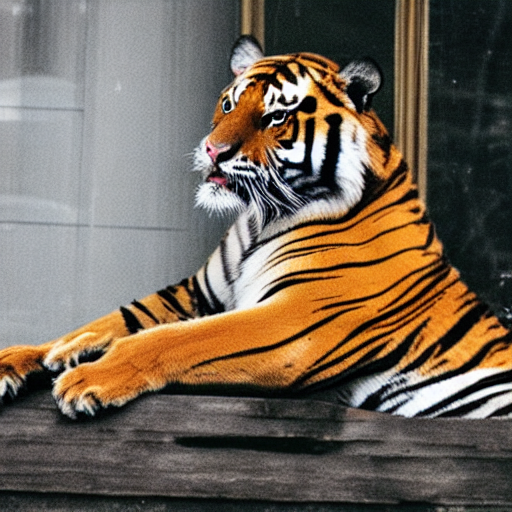

In [ ]:
# Генерация до обучения эмбеддинга с новым промптом
image, _ = text2image_simple(ldm_stable, orig_emb, max_length, latent=start_code)
ptp_utils.view_images(image)

In [ ]:
# Обучаем эмбеддинг

emb = orig_emb.clone()
emb = emb.detach()
emb.requires_grad_()

orig_emb = orig_emb.detach()
orig_emb.requires_grad_(False)
ldm_stable.vae.requires_grad_(False)
ldm_stable.unet.requires_grad_(False)
ldm_stable.text_encoder.requires_grad_(False)
ldm_stable.unet.eval()
ldm_stable.vae.eval()
ldm_stable.text_encoder.eval()

lr = 0.005
it = 1000
height = width = 512
optimizer = torch.optim.Adam([emb], lr=lr)
criterion = torch.nn.MSELoss()
history = []
reg_coeff = 1e-5

pbar = tqdm(range(it))
for i in pbar:
    # Sample noise that we'll add to the latents
    noise = torch.randn(init_image_latents.shape).to(init_image_latents.device)
    timesteps = torch.randint(1000, (1,), device=init_image_latents.device)

    # Add noise to the latents according to the noise magnitude at each timestep
    # (this is the forward diffusion process)
    noisy_latents = ldm_stable.scheduler.add_noise(init_image_latents, noise, timesteps)

    # Predict the noise residual
    noise_pred = ldm_stable.unet(noisy_latents, timesteps, emb).sample

    loss = criterion(noise_pred, noise) + reg_coeff * ((emb - orig_emb) ** 2).sum()
    loss.backward()
    pbar.set_postfix({"loss": loss.item()})
    history.append(loss.item())

    optimizer.step()
    optimizer.zero_grad()

  0%|          | 0/1000 [00:00<?, ?it/s]

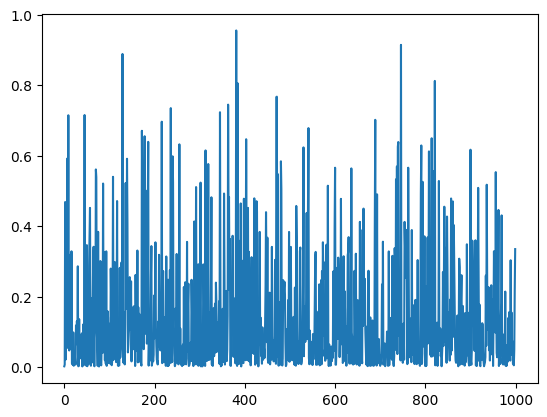

  0%|          | 0/50 [00:00<?, ?it/s]

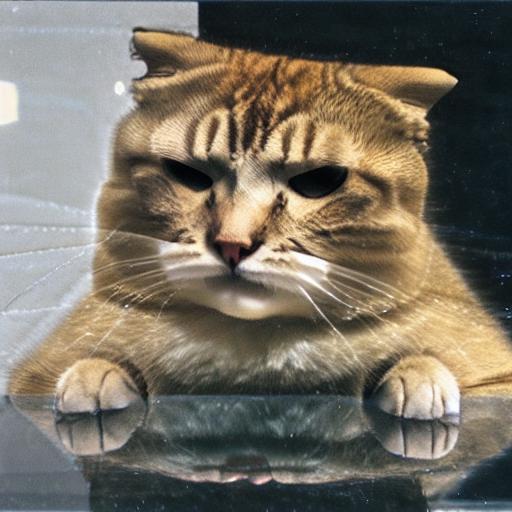

In [ ]:
# После обучения с новым промптом
import matplotlib.pyplot as plt
plt.plot(history)
plt.show()

image, _ = text2image_simple(ldm_stable, emb, max_length, latent=start_code)
ptp_utils.view_images(image)

In [ ]:
((emb - orig_emb) ** 2).sum()

tensor(72.7266, device='cuda:0', grad_fn=<SumBackward0>)

In [ ]:
# Null-text inversion, используя обученный эмбеддинг как эмбеддинг исходного промпта
image_path = "./gnochi_mirror.jpeg"
emb.requires_grad_(False)
(image_gt, image_enc), x_t, uncond_embeddings = null_inversion.invert(
    image_path, emb, max_length=max_length, offsets=(0,0,200,0), verbose=True, num_inner_steps=10
)

DDIM inversion...
Null-text optimization...


  0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
from torchvision.utils import make_grid
from IPython.display import clear_output

alpha_range = (0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1)

grid = []
for alpha in tqdm(alpha_range):
    new_emb = alpha * orig_emb + (1-alpha) * emb
    image, _ = text2image_simple(ldm_stable, new_emb, max_length, uncond_embeddings=uncond_embeddings, latent=x_t)
    grid.append(torch.from_numpy(image).squeeze(0).permute(2, 0, 1))
clear_output()
grid = make_grid(grid, nrow=len(alpha_range))

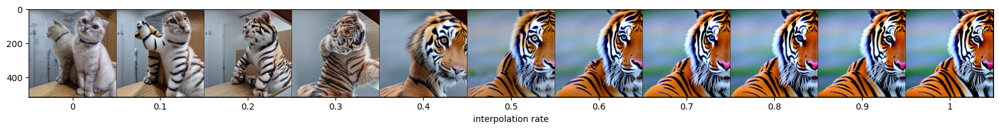

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 7))
plt.imshow(grid.permute(1, 2, 0))

delta_x = (grid.shape[2] / len(alpha_range)) / 2
x_ticks = np.arange(len(alpha_range)) * delta_x * 2  + delta_x
plt.xticks(ticks=x_ticks, labels=alpha_range)
plt.xlabel('interpolation rate')

plt.show()

In [ ]:
from torchvision.utils import make_grid
from IPython.display import clear_output

alpha_range = np.linspace(0, 0.2, 10)

grid = []
for alpha in tqdm(alpha_range):
    new_emb = alpha * orig_emb + (1-alpha) * emb
    image, _ = text2image_simple(ldm_stable, new_emb, max_length, uncond_embeddings=uncond_embeddings, latent=x_t)
    grid.append(torch.from_numpy(image).squeeze(0).permute(2, 0, 1))
clear_output()
grid = make_grid(grid, nrow=len(alpha_range))

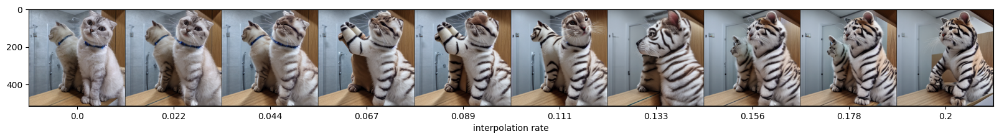

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 7))
plt.imshow(grid.permute(1, 2, 0))

delta_x = (grid.shape[2] / len(alpha_range)) / 2
x_ticks = np.arange(len(alpha_range)) * delta_x * 2  + delta_x
plt.xticks(ticks=x_ticks, labels=np.round(alpha_range, decimals=3))
plt.xlabel('interpolation rate')

plt.show()

### Strong regularization

In [ ]:
scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False, set_alpha_to_one=False)
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
ldm_stable = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", scheduler=scheduler).to(device)
try:
    ldm_stable.disable_xformers_memory_efficient_attention()
except AttributeError:
    print("Attribute disable_xformers_memory_efficient_attention() is missing")

In [ ]:
input_image = "./gnochi_mirror.jpeg"
prompt = "a photo of a tiger sitting next to a mirror"

text_input = ldm_stable.tokenizer(
    prompt,
    padding="max_length",
    max_length=ldm_stable.tokenizer.model_max_length,
    truncation=True,
    return_tensors="pt",
)
max_length = text_input.input_ids.shape[-1]
orig_emb = ldm_stable.text_encoder(text_input.input_ids.to(ldm_stable.device))[0]

emb = orig_emb.clone()

latents_dtype = emb.dtype

init_image = torch.from_numpy(load_512(input_image)).float() / 127.5 - 1
init_image = init_image.permute(2, 0, 1).unsqueeze(0).to(device=ldm_stable.device, dtype=latents_dtype)
init_image_latents = ldm_stable.vae.encode(init_image)['latent_dist'].mean
init_image_latents = 0.18215 * init_image_latents

start_code = torch.randn_like(init_image_latents.detach())

In [ ]:
# Генерация до обучения эмбеддинга с новым промптом
image, _ = text2image_simple(ldm_stable, orig_emb, max_length, latent=start_code)
ptp_utils.view_images(image)

In [ ]:
# Обучаем эмбеддинг

emb = orig_emb.clone()
emb = emb.detach()
emb.requires_grad_()

orig_emb = orig_emb.detach()
orig_emb.requires_grad_(False)
ldm_stable.vae.requires_grad_(False)
ldm_stable.unet.requires_grad_(False)
ldm_stable.text_encoder.requires_grad_(False)
ldm_stable.unet.eval()
ldm_stable.vae.eval()
ldm_stable.text_encoder.eval()

lr = 0.005
it = 1000
height = width = 512
optimizer = torch.optim.Adam([emb], lr=lr)
criterion = torch.nn.MSELoss()
history = []
reg_coeff = 1e-3

pbar = tqdm(range(it))
for i in pbar:
    # Sample noise that we'll add to the latents
    noise = torch.randn(init_image_latents.shape).to(init_image_latents.device)
    timesteps = torch.randint(1000, (1,), device=init_image_latents.device)

    # Add noise to the latents according to the noise magnitude at each timestep
    # (this is the forward diffusion process)
    noisy_latents = ldm_stable.scheduler.add_noise(init_image_latents, noise, timesteps)

    # Predict the noise residual
    noise_pred = ldm_stable.unet(noisy_latents, timesteps, emb).sample

    loss = criterion(noise_pred, noise) + reg_coeff * ((emb - orig_emb) ** 2).sum()
    loss.backward()
    pbar.set_postfix({"loss": loss.item()})
    history.append(loss.item())

    optimizer.step()
    optimizer.zero_grad()

  0%|          | 0/1000 [00:00<?, ?it/s]

In [ ]:
# После обучения с новым промптом
import matplotlib.pyplot as plt
plt.plot(history)
plt.show()

image, _ = text2image_simple(ldm_stable, emb, max_length, latent=start_code)
ptp_utils.view_images(image)

In [ ]:
((emb - orig_emb) ** 2).sum()

tensor(0.1378, device='cuda:0', grad_fn=<SumBackward0>)

In [ ]:
# Null-text inversion, используя обученный эмбеддинг как эмбеддинг исходного промпта
image_path = "./gnochi_mirror.jpeg"
emb.requires_grad_(False)
(image_gt, image_enc), x_t, uncond_embeddings = null_inversion.invert(
    image_path, emb, max_length=max_length, offsets=(0,0,200,0), verbose=True, num_inner_steps=10
)

DDIM inversion...
Null-text optimization...


  0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
# проверяем inversion
controller = AttentionStore()
image_inv, x_t = run_and_display(emb, max_length, controller, run_baseline=False, latent=x_t, uncond_embeddings=uncond_embeddings, verbose=False)
print("showing from left to right: the ground truth image, the vq-autoencoder reconstruction, the null-text inverted image")
ptp_utils.view_images([image_gt, image_enc, image_inv[0]])

In [ ]:
from torchvision.utils import make_grid
from IPython.display import clear_output

alpha_range = (0, 0.2, 0.4, 0.6, 0.8, 1)

grid = []
for alpha in tqdm(alpha_range):
    new_emb = alpha * orig_emb + (1-alpha) * emb
    image, _ = text2image_simple(ldm_stable, new_emb, max_length, uncond_embeddings=uncond_embeddings, latent=x_t)
    grid.append(torch.from_numpy(image).squeeze(0).permute(2, 0, 1))
clear_output()
grid = make_grid(grid, nrow=len(alpha_range))

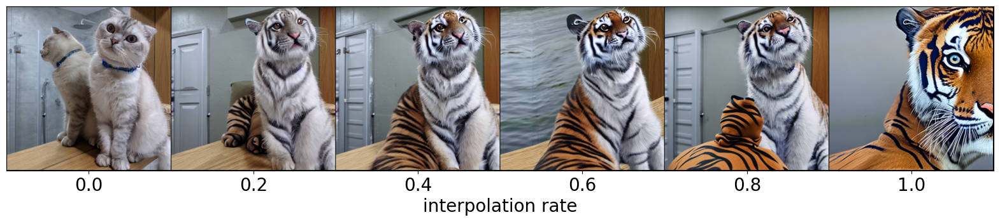

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 7))
plt.imshow(grid.permute(1, 2, 0))

delta_x = (grid.shape[2] / len(alpha_range)) / 2
x_ticks = np.arange(len(alpha_range)) * delta_x * 2  + delta_x
plt.xticks(ticks=x_ticks, labels=np.round(alpha_range, decimals=3), fontsize=20)
plt.xlabel('interpolation rate', fontsize=20)

plt.yticks(ticks=[])

plt.show()

## Imagic code

In [ ]:
def learn_embedding(
    image_path, prompt, model, lr=0.005, n_iters=1000, reg_coeff=1e-3
    ):
    """
    Parameters:
    image_path: str
        path to initial image
    prompt: str
        prompt describing the resukt of editing
    model: StableDiffusionPipeline
        pretrained stable diffusion model
    lr: float
        learning rate
    n_iters: int
        number of optimization steps
    reg_coeff: float
        regularization coefficient
    
    Returns: 
    torch.Tensor
        learned embedding (e_opt)
    torch.Tensor
        target embedding (e_tgt)
    int
        length of tokenized prompt
    """

    # Get an original embedding, corresponding to the editing prompt (e_tgt)
    text_input = model.tokenizer(
        prompt,
        padding="max_length",
        max_length=model.tokenizer.model_max_length,
        truncation=True,
        return_tensors="pt",
    )
    max_length = text_input.input_ids.shape[-1]
    orig_emb = model.text_encoder(text_input.input_ids.to(model.device))[0]

    # Learn an embedding, corresponding to the initial image (e_opt)
    emb = orig_emb.clone()
    emb = emb.detach()
    emb.requires_grad_()

    orig_emb = orig_emb.detach()
    orig_emb.requires_grad_(False)
    model.vae.requires_grad_(False)
    model.unet.requires_grad_(False)
    model.text_encoder.requires_grad_(False)
    model.unet.eval()
    model.vae.eval()
    model.text_encoder.eval()

    optimizer = torch.optim.Adam([emb], lr=lr)
    criterion = torch.nn.MSELoss()

    image = torch.from_numpy(load_512(image_path)).float() / 127.5 - 1
    image = image.permute(2, 0, 1).unsqueeze(0).to(device=model.device, dtype=emb.dtype)
    latents = model.vae.encode(image)['latent_dist'].mean
    latents = latents * 0.18215

    print('Learning an embedding...')
    pbar = tqdm(range(n_iters))
    for i in pbar:
        noise = torch.randn(latents.shape).to(latents.device)
        timesteps = torch.randint(1000, (1,), device=latents.device)

        noisy_latents = model.scheduler.add_noise(latents, noise, timesteps)
        noise_pred = model.unet(noisy_latents, timesteps, emb).sample

        loss = criterion(noise_pred, noise) + reg_coeff * ((emb - orig_emb) ** 2).sum()
        loss.backward()
        pbar.set_postfix({"loss": loss.item()})
        optimizer.step()
        optimizer.zero_grad()
    emb.requires_grad_(False)

    return emb, orig_emb, max_length

In [ ]:
from torchvision.utils import make_grid
from IPython.display import clear_output
import matplotlib.pyplot as plt

def generate_with_interpolation(
    init_emb, learned_emb, max_length, latent,
    alpha_range = (0, 0.2, 0.4, 0.6, 0.8, 1), uncond_embeddings=None, figsize=(20, 7)
):
    grid = []
    for alpha in tqdm(alpha_range):
        new_emb = alpha * init_emb + (1-alpha) * learned_emb
        image, _ = text2image_simple(ldm_stable, new_emb, max_length, uncond_embeddings=uncond_embeddings, latent=latent)
        grid.append(torch.from_numpy(image).squeeze(0).permute(2, 0, 1))
    clear_output()
    grid = make_grid(grid, nrow=len(alpha_range))

    plt.figure(figsize=figsize)
    plt.imshow(grid.permute(1, 2, 0))

    delta_x = (grid.shape[2] / len(alpha_range)) / 2
    x_ticks = np.arange(len(alpha_range)) * delta_x * 2  + delta_x
    plt.xticks(ticks=x_ticks, labels=np.round(alpha_range, decimals=3), fontsize=20)
    plt.xlabel('interpolation rate', fontsize=20)

    plt.yticks(ticks=[])

    plt.show()

    return grid

In [ ]:
from IPython.display import clear_output

LOW_RESOURCE = False 
NUM_DDIM_STEPS = 50
GUIDANCE_SCALE = 7.5
MAX_NUM_WORDS = 77

def reload_model():
    scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False, set_alpha_to_one=False)
    device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
    ldm_stable = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", scheduler=scheduler).to(device)
    try:
        ldm_stable.disable_xformers_memory_efficient_attention()
    except AttributeError:
        print("Attribute disable_xformers_memory_efficient_attention() is missing")
    clear_output()
    
    return ldm_stable

## Examples

### A picture of a cat

In [ ]:
image_path = "./gnochi_mirror.jpeg"
prompt = "a photo of a mirror"
model = reload_model()

# Get a learned embedding
emb, orig_emb, max_length = learn_embedding(image_path, prompt, model)

# Null-text inversion, using a learned embedding as an embedding of an initial prompt
(image_gt, image_enc), x_t, uncond_embeddings = null_inversion.invert(image_path, emb, max_length=max_length, offsets=(0,0,200,0), verbose=True)

Learning an embedding...


  0%|          | 0/1000 [00:00<?, ?it/s]

DDIM inversion...
Null-text optimization...


  0%|          | 0/500 [00:00<?, ?it/s]

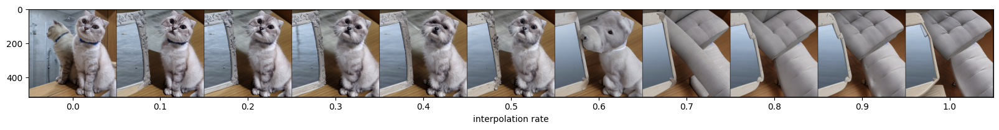

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, x_t, uncond_embeddings=uncond_embeddings)

In [ ]:
image_path = "./gnochi_mirror.jpeg"
prompt = "watercolor painting of a cat sitting next to a mirror"
model = reload_model()

# Get a learned embedding
emb, orig_emb, max_length = learn_embedding(image_path, prompt, model)

# Null-text inversion, using a learned embedding as an embedding of an initial prompt
(image_gt, image_enc), x_t, uncond_embeddings = null_inversion.invert(image_path, emb, max_length=max_length, offsets=(0,0,200,0), verbose=True)

Learning an embedding...


  0%|          | 0/1000 [00:00<?, ?it/s]

DDIM inversion...
Null-text optimization...


  0%|          | 0/500 [00:00<?, ?it/s]

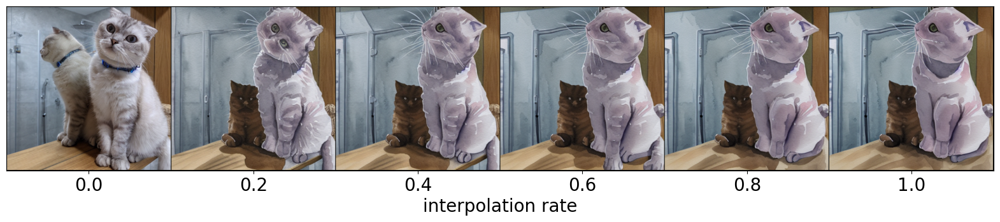

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, x_t, uncond_embeddings=uncond_embeddings)

### A picture of a cake

In [ ]:
image_path = "./cake2.png"
prompt = "a pistachio cake"
model = reload_model()

# Get a learned embedding
emb, orig_emb, max_length = learn_embedding(image_path, prompt, model)

# Null-text inversion, using a learned embedding as an embedding of an initial prompt
(image_gt, image_enc), x_t, uncond_embeddings = null_inversion.invert(image_path, emb, max_length=max_length, verbose=True)

Learning an embedding...


  0%|          | 0/1000 [00:00<?, ?it/s]

DDIM inversion...
Null-text optimization...


  0%|          | 0/500 [00:00<?, ?it/s]

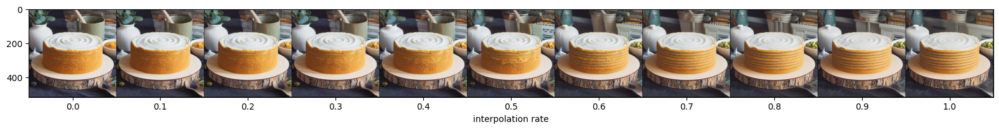

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, x_t, uncond_embeddings=uncond_embeddings)

In [ ]:
image_path = "./cake2.png"
prompt = "a pistachio cake"
model = reload_model()

# Get a learned embedding
emb, orig_emb, max_length = learn_embedding(image_path, prompt, model, reg_coeff=1e-3)

# Null-text inversion, using a learned embedding as an embedding of an initial prompt
(image_gt, image_enc), x_t, uncond_embeddings = null_inversion.invert(image_path, emb, max_length=max_length, verbose=True)

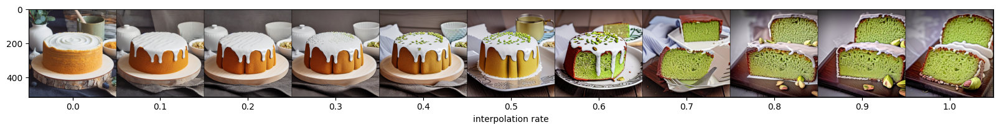

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, x_t, uncond_embeddings=uncond_embeddings)

### A full face photo

In [ ]:
image_path = "./face.jpeg"
prompt = "a photo of a smiling young woman"
model = reload_model()
clear_output()

# Get a learned embedding
emb, orig_emb, max_length = learn_embedding(image_path, prompt, model)

# Null-text inversion, using a learned embedding as an embedding of an initial prompt
(image_gt, image_enc), x_t, uncond_embeddings = null_inversion.invert(image_path, emb, max_length=max_length, verbose=True)

Learning an embedding...


  0%|          | 0/1000 [00:00<?, ?it/s]

DDIM inversion...
Null-text optimization...


  0%|          | 0/500 [00:00<?, ?it/s]

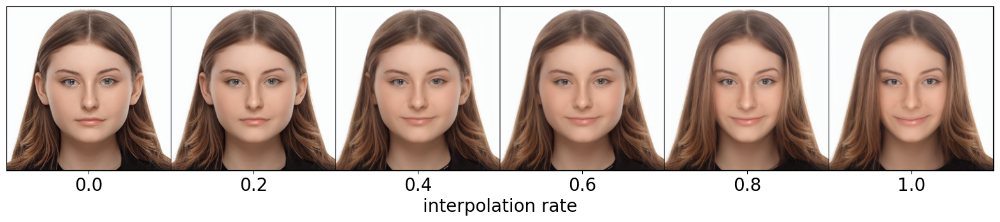

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, x_t, uncond_embeddings=uncond_embeddings)

In [ ]:
image_path = "./face.jpeg"
prompt = "a photo of a young woman wearing glasses"
model = reload_model()
clear_output()

# Get a learned embedding
emb, orig_emb, max_length = learn_embedding(image_path, prompt, model)

# Null-text inversion, using a learned embedding as an embedding of an initial prompt
(image_gt, image_enc), x_t, uncond_embeddings = null_inversion.invert(image_path, emb, max_length=max_length, verbose=True)

Learning an embedding...


  0%|          | 0/1000 [00:00<?, ?it/s]

DDIM inversion...
Null-text optimization...


  0%|          | 0/500 [00:00<?, ?it/s]

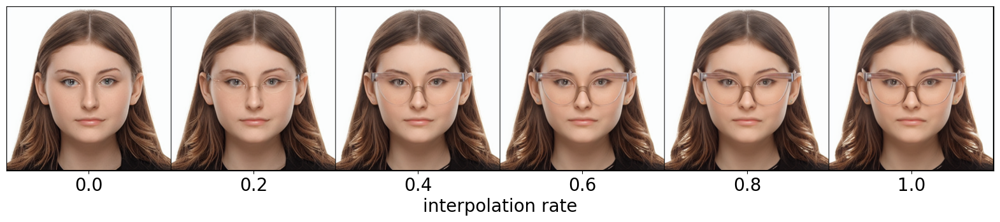

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, x_t, uncond_embeddings=uncond_embeddings)

### A picture of a man eating a doughnut in the park

In [ ]:
image_path = "./man.jpeg"
prompt = "a red-haired man in glasses eating a doughnut in the park"
model = reload_model()

# Get a learned embedding
emb, orig_emb, max_length = learn_embedding(image_path, prompt, model, reg_coeff=5e-4)

# Null-text inversion, using a learned embedding as an embedding of an initial prompt
(image_gt, image_enc), x_t, uncond_embeddings = null_inversion.invert(image_path, emb, max_length=max_length, verbose=True)

Learning an embedding...


  0%|          | 0/1000 [00:00<?, ?it/s]

DDIM inversion...
Null-text optimization...


  0%|          | 0/500 [00:00<?, ?it/s]

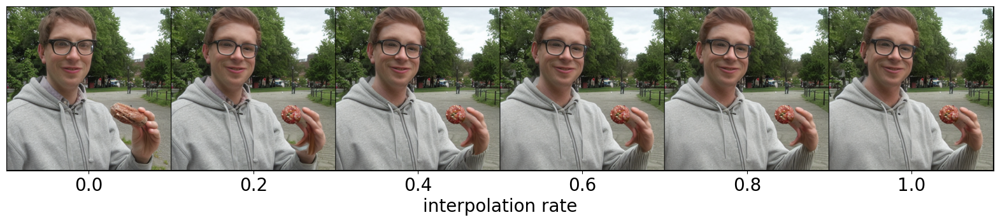

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, x_t, uncond_embeddings=uncond_embeddings)

In [ ]:
image_path = "./man.jpeg"
prompt = "a man in glasses eating a doughnut in the desert"
model = reload_model()
clear_output()

# Get a learned embedding
emb, orig_emb, max_length = learn_embedding(image_path, prompt, model)

# Null-text inversion, using a learned embedding as an embedding of an initial prompt
(image_gt, image_enc), x_t, uncond_embeddings = null_inversion.invert(image_path, emb, max_length=max_length, verbose=True)

Learning an embedding...


  0%|          | 0/1000 [00:00<?, ?it/s]

DDIM inversion...
Null-text optimization...


  0%|          | 0/500 [00:00<?, ?it/s]

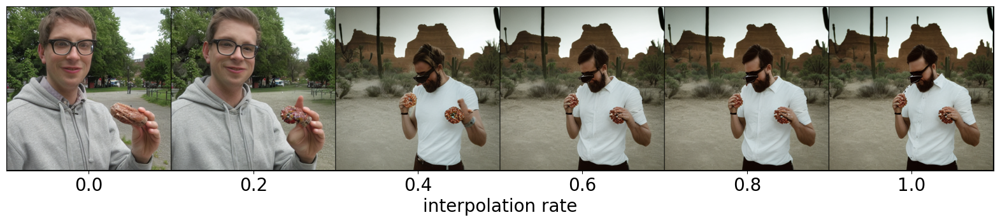

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, x_t, uncond_embeddings=uncond_embeddings)

### A picture of a baby

In [ ]:
image_path = "./baby.jpeg"
prompt = "a baby wearing a blue shirt lying on the grass"
model = reload_model()
clear_output()

# Get a learned embedding
emb, orig_emb, max_length = learn_embedding(image_path, prompt, model, reg_coeff=5e-4)

# Null-text inversion, using a learned embedding as an embedding of an initial prompt
(image_gt, image_enc), x_t, uncond_embeddings = null_inversion.invert(image_path, emb, max_length=max_length, verbose=True)

Learning an embedding...


  0%|          | 0/1000 [00:00<?, ?it/s]

DDIM inversion...
Null-text optimization...


  0%|          | 0/500 [00:00<?, ?it/s]

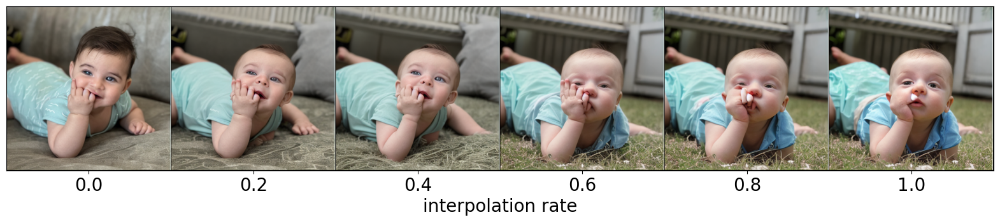

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, x_t, uncond_embeddings=uncond_embeddings)